<a href="https://colab.research.google.com/github/LizzieChall/Dog-breed-classification/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end Multi-class Dog Bread Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at a cafe and I take a photo of a dog, I want to know what breed it is.

## 2. Data

The data we're using is from KAggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/overview

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with some images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs(this means there are 120 different classes).
* There are around 10,000+ images in the training set
(the images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).



In [ ]:
# unzip the uploaded data into Google Drive
#!unzip "/content/drive/MyDrive/DogVision/dog-breed-identification (2).zip" -d "/content/drive/MyDrive/DogVision/"

### Get our workspace ready.

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
# Import necessary tools into Colab
import tensorflow as tf
import tensorflow_hub as hub
import tf_keras as tfk

print("TF keras:", tfk.__version__)
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (Yess :))" if tf.config.list_physical_devices("GPU") else "not available :(")

TF keras: 2.18.0
TF version: 2.18.0
TF Hub version: 0.16.1
GPU available (Yess :))


## Getting our data ready(turning it into Tensors).

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing forst. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Check out the labels of our data using pandas
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/DogVision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

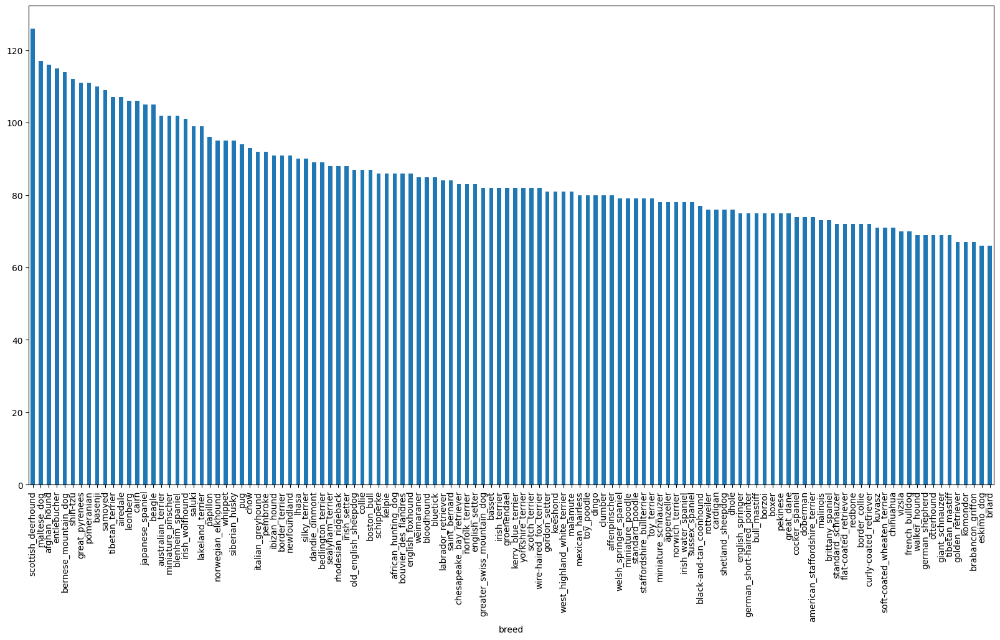

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().mean()

np.float64(85.18333333333334)

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

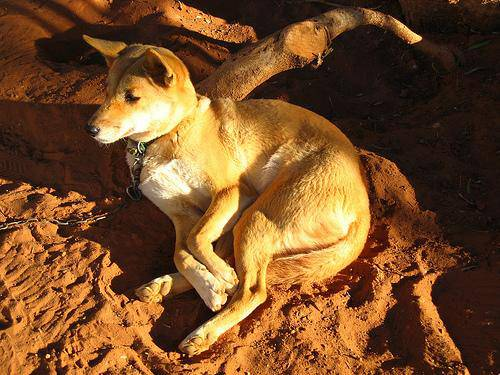

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting Images and their Labels

Getting a list of all of the image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image IDs
filepaths = ["drive/MyDrive/DogVision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filepaths[:10]

['drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filepaths matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/DogVision/train/")) == len(filepaths):
  print("Filepaths match actual amount of files!!! Proceed.")
else:
  print("Filepaths do not match actual amount of files. Check the target directory.")

Filepaths match actual amount of files!!! Proceed.


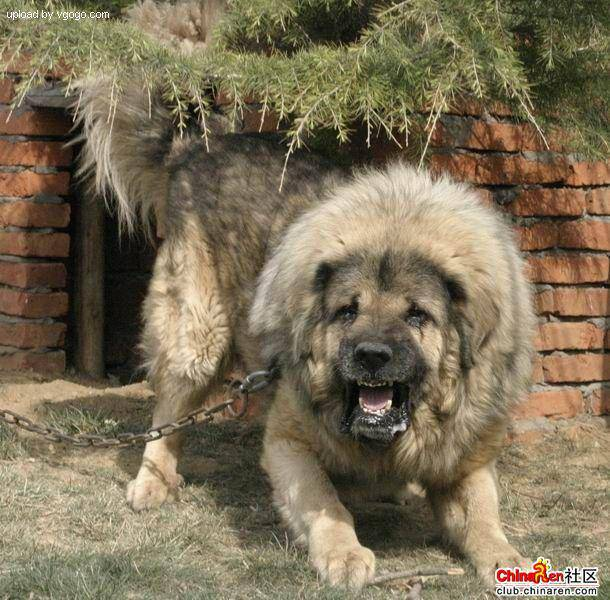

In [ ]:
# One more check
Image(filepaths[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

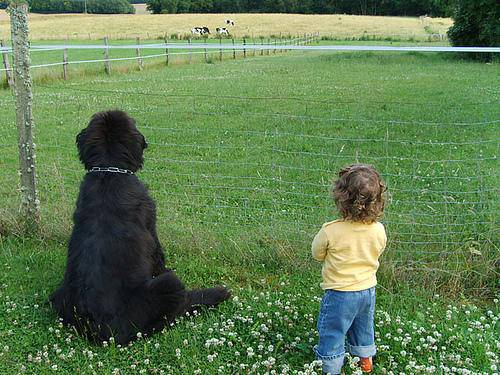

In [ ]:
Image(filepaths[7067])

In [ ]:
labels_csv["breed"][7067]

'newfoundland'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np

labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filepaths
if len(labels) == len(filepaths):
  print("Number of labels matches number of filepaths!!")
else:
  print("Number of labels does not match number of filepaths, check data directories!")

Number of labels matches number of filepaths!!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # There will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filepaths[:10]

['drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Set up x & y variables
X = filepaths
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split


# Slit them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the trainiong data
X_train[:5], y_train[:2]

(['drive/MyDrive/DogVision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/DogVision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/DogVision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/DogVision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/DogVision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False

## Preprocessing images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

https://www.tensorflow.org/guide/data

https://www.tensorflow.org/tutorials/load_data/images


Before we do, let's see what importing an image looks like.

In [ ]:
# Convert an image to numpy array
from matplotlib.pyplot import imread
image = imread(filepaths[42])
image.shape
# height, width, color-channel

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
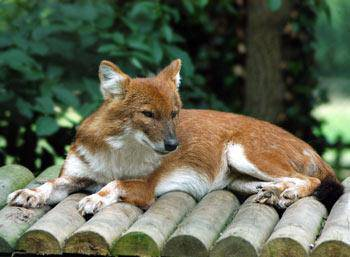

In [ ]:
image

In [ ]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

In [ ]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function tp preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image= tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0 - 255 to 0 - 1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 images (batch size) at a time (you can manually adjust the batch size if needed).

In orderto use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [ ]:
# Create a simple function to return a tuple of Tensors
def get_image_label(image_path, label):
  """
  Takes an image file path name and associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data X and y into batches.

https://x.com/ylecun/status/989610208497360896?s=20

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn our data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label(y) pairs.
  It shuffles the data if it's training data, but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                              tf.constant(y))) # labels

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print(" Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the imagepaths into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches to test the code
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

 Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches however, these can be a little hard to understand/comprehend, let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displayiny 25 images)
  for i in range(25):
    # Create subplots(5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

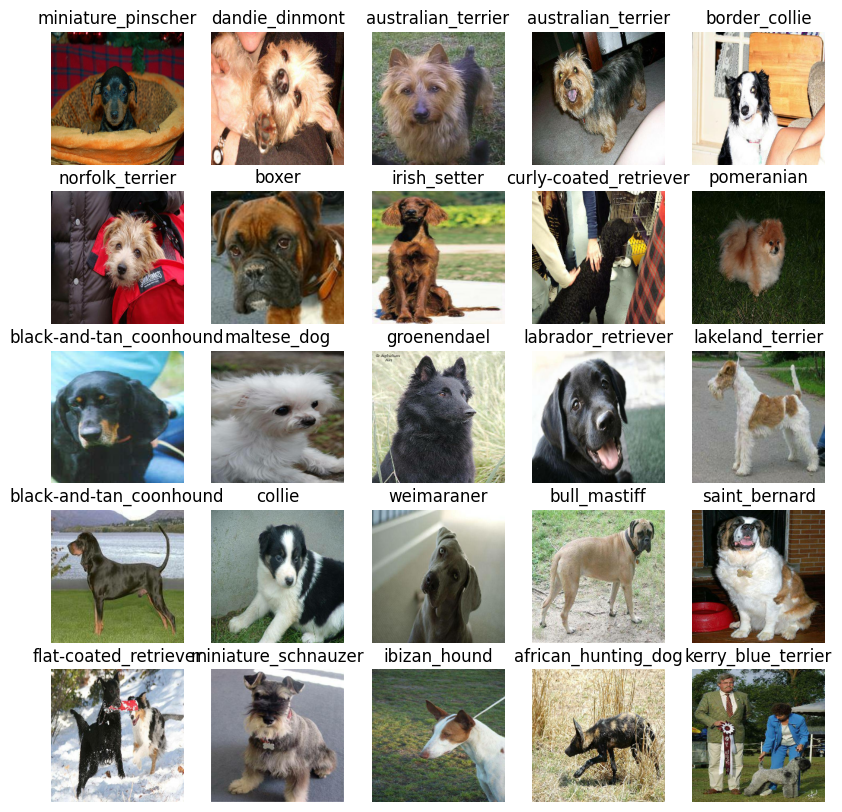

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

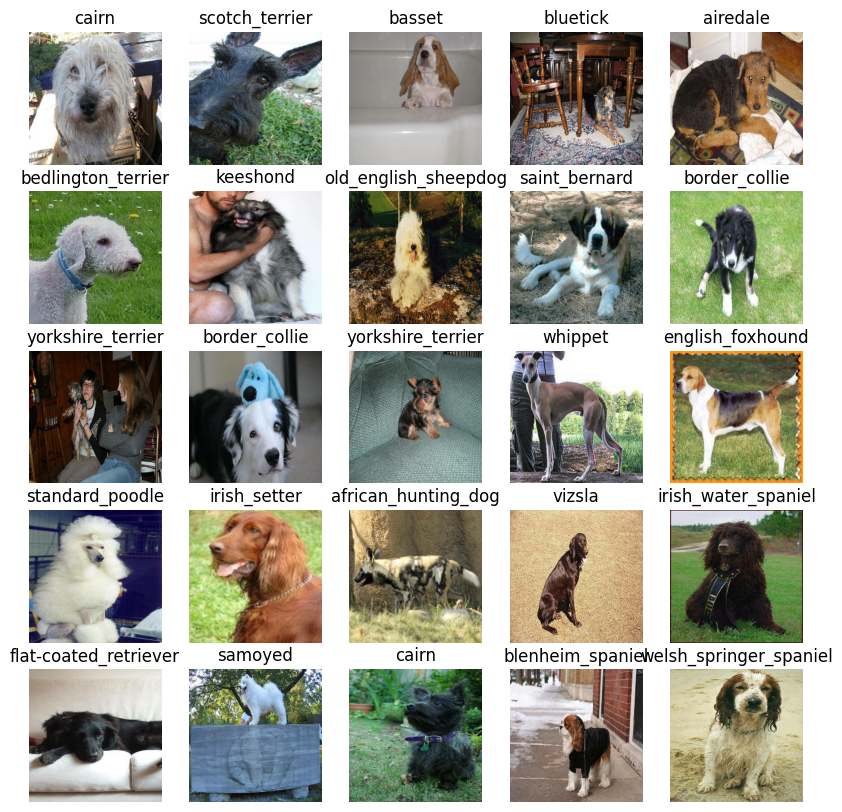

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.

https://www.kaggle.com/models?tfhub-redirect=true

https://www.tensorflow.org/hub

https://paperswithcode.com/

In [ ]:
IMG_SIZE = 224
# Setup input shape to the model
INPUT_SHAPE =   [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

Now we've got our inputs, outputs, and model ready to go.
Let's put them together into a Keras deep learning model.

Knowing this let's create a function which:
* Takes th einput shape, output shape, and the model we've chosen as parameters.
* Defines the layers in a Keras modelin sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras

In [ ]:
# Create a function to build a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:" , model_url)
  # Setup the model Layers
  model= tfk.Sequential([
        hub.KerasLayer(model_url),
                       tfk.layers.Dense(units=output_shape,
                                        activation='softmax')
                       ])

    # compile the model
  model.compile(
        loss=tfk.losses.CategoricalCrossentropy(),
        optimizer=tfk.optimizers.Adam(),
        metrics=['accuracy']
    )

    # build the model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_7 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_7 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1, 1, 1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating Callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress, or stop training early if a model stops improving.

We'll create two callbacks:
1. For TensorBoard - which helps track our models progress and,
2. For early stopping - which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a diresctory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime
#import tf_keras

# Create a function to build a TensorBoard callback
def _create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/DogVision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tfk.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tfk.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Trainng a model (on a subset of data)

Our first is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we are still running on a GPU
print("GPU", "available (Yess :))" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (Yess :))


Let's create a function which trains the model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation dadta, number of epochs to train(NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = _create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 185s 6s/step - loss: 4.5925 - accuracy: 0.1025 - val_loss: 3.4392 - val_accuracy: 0.2150
Epoch 2/100
25/25 [==============================] - 3s 128ms/step - loss: 1.6056 - accuracy: 0.7100 - val_loss: 2.1203 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 4s 152ms/step - loss: 0.5491 - accuracy: 0.9425 - val_loss: 1.6447 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 4s 174ms/step - loss: 0.2466 - accuracy: 0.9900 - val_loss: 1.4515 - val_accuracy: 0.6750
Epoch 5/100
25/25 [==============================] - 4s 178ms/step - loss: 0.1430 - accuracy: 0.9987 - val_loss: 1.3595 - val_accuracy: 0.6850
Epoch 6/100
25/25 [==============================] - 4s 155ms/step - loss: 0.0981 - accuracy: 0.9987 - val_loss: 1.3234 - val_accuracy: 0.6900
Epoch 7/100
25/25 [================

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/DogVision/logs

Reusing TensorBoard on port 6006 (pid 8816), started 1:56:23 ago. (Use '!kill 8816' to kill it.)

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model.

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data(not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 100ms/step


array([[1.11574261e-03, 7.54693319e-05, 5.08201774e-04, ...,
        7.75763649e-04, 1.75608380e-04, 3.22391791e-03],
       [9.48249304e-04, 9.64971623e-05, 1.52312070e-02, ...,
        8.53969774e-04, 2.28809402e-03, 1.50021093e-04],
       [2.26295961e-05, 1.04437393e-04, 9.67667511e-05, ...,
        1.38479969e-04, 1.03778046e-04, 8.90953961e-05],
       ...,
       [3.47808736e-07, 5.79203006e-05, 2.80934182e-05, ...,
        3.74882984e-06, 8.05108630e-06, 1.18269578e-04],
       [5.08905062e-03, 1.61284857e-04, 2.16105054e-05, ...,
        1.64052530e-04, 4.62307944e-05, 5.15494496e-03],
       [4.62087366e-04, 9.96835006e-05, 5.67384996e-04, ...,
        9.86576430e-04, 1.81427237e-03, 1.81720043e-05]], dtype=float32)

In [ ]:
predictions[0]

array([1.11574261e-03, 7.54693319e-05, 5.08201774e-04, 6.88573637e-05,
       2.07871577e-04, 2.11320839e-05, 2.76674144e-02, 2.76304752e-04,
       2.12317944e-04, 9.46613261e-04, 2.90880853e-04, 1.88269441e-05,
       2.57695327e-04, 7.25823047e-05, 4.38686373e-04, 5.42349473e-04,
       4.10009052e-05, 4.92366105e-02, 4.94335691e-05, 7.22305413e-05,
       5.46881580e-04, 2.24596602e-04, 1.30502503e-05, 3.70577001e-03,
       3.75061099e-05, 3.41148232e-04, 4.69721943e-01, 6.64125109e-05,
       1.13948935e-03, 1.38551448e-04, 6.94182745e-05, 2.04138225e-03,
       6.41707680e-04, 2.08623569e-05, 7.00487872e-05, 5.07511850e-03,
       3.95802999e-06, 1.59609961e-04, 7.01205063e-05, 1.21113473e-04,
       5.47214935e-04, 2.10370345e-05, 1.36739312e-04, 6.68429930e-05,
       6.51901792e-05, 3.71160393e-04, 2.56317755e-04, 1.80325122e-04,
       5.94701909e-04, 1.87880869e-04, 3.96926625e-04, 1.67033395e-05,
       5.21334121e-04, 1.83627009e-04, 4.40631877e-04, 1.85267985e-04,
      

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.7880011e-04 9.5267191e-05 3.7195263e-05 8.4427731e-05 1.9814048e-03
 2.0969688e-04 3.8623341e-04 8.4057887e-04 3.9090342e-03 4.6332788e-02
 4.1688072e-05 8.1036051e-06 3.0855916e-04 2.0590266e-03 4.3690621e-04
 3.8265856e-03 4.7138510e-05 9.8546319e-05 2.1352201e-04 1.5758218e-04
 1.9649411e-05 7.8088255e-04 2.5148376e-05 2.0642170e-05 6.5244930e-03
 3.0254909e-05 3.9750466e-04 2.0922166e-04 1.6595414e-04 2.7868993e-05
 3.0389201e-04 2.2247108e-05 5.8617516e-05 5.0255931e-05 4.7975223e-05
 3.4817709e-05 4.6677873e-05 2.3978324e-04 6.2632622e-05 2.8613937e-01
 2.9120958e-04 2.7653987e-05 7.8901956e-03 8.3565437e-06 5.0000887e-04
 1.9610734e-05 7.0235837e-05 1.3594301e-03 4.4168868e-05 1.4962083e-04
 3.0352070e-05 1.9707298e-04 2.5264619e-04 1.5421221e-03 1.8505376e-05
 5.3303182e-04 2.1291181e-04 6.8106994e-05 5.6941783e-05 2.4433364e-05
 5.3969787e-05 1.5230051e-03 7.9726915e-06 1.2211459e-05 1.4417728e-04
 6.8251982e-05 2.5816522e-05 7.8638771e-04 9.6233191e-05 8.4682670e-06
 4.454

Having the above functionality is great but we want to be able to do it at scale.

It would be even better if we could see the image the prediction is being made on.

**NB:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[10])
pred_label

'lakeland_terrier'

Since our validation data is still in a batch dataset, we'll have to unabtch it to make predictions on the validation images and then compare those predictions to the validation labels (truthlabels).

https://www.tensorflow.org/api_docs/python/tf/data/Dataset#unbatch

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make a function to make these all a bit more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels, and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probabitlity, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is rightor wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction, and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

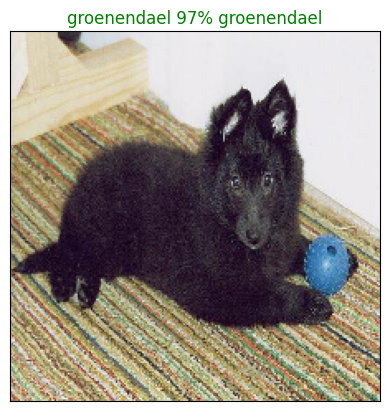

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our model's top prediction, let'smake another to view our model's top predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidence values and labels for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of the true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

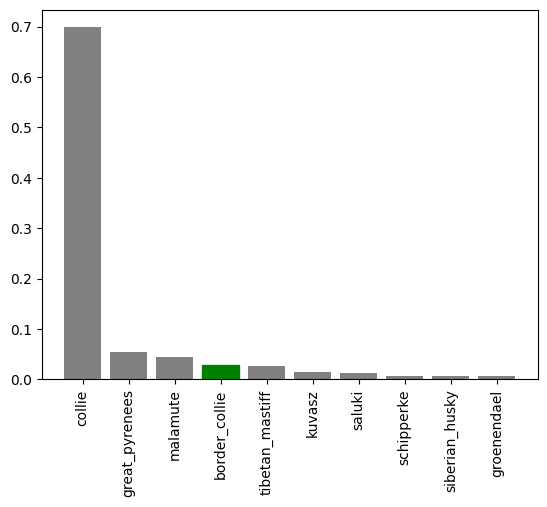

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
              labels=val_labels,
              n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

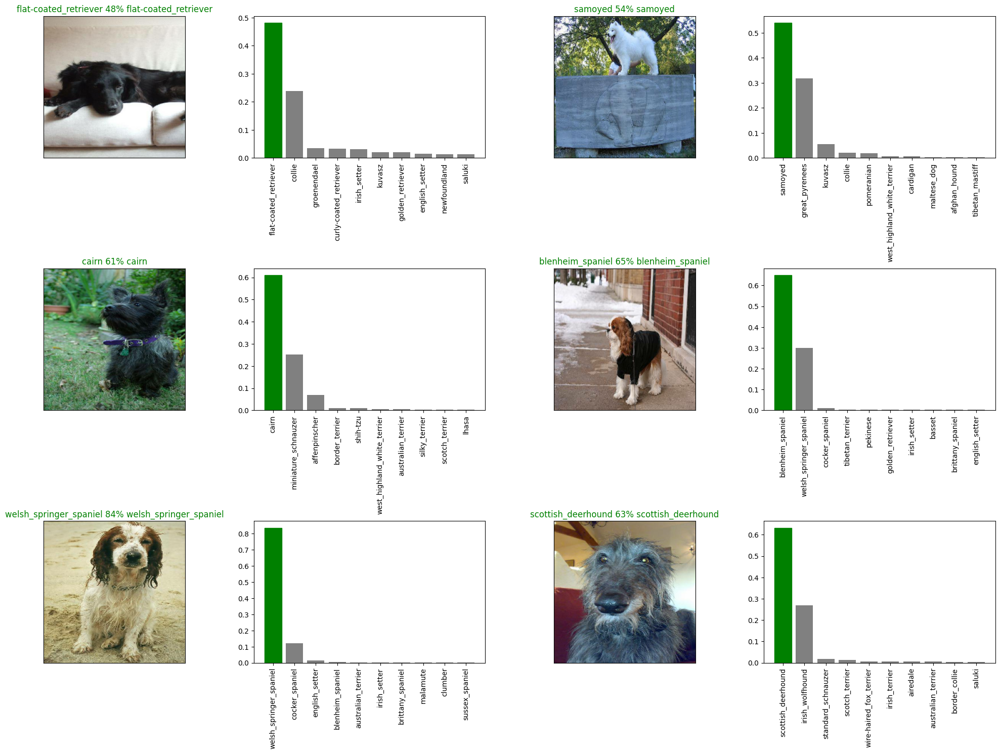

In [ ]:
# Let's check a few predictions and their values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and loading a trained model.



In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/DogVision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tfk.models.load_model(model_path,
                                custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work.

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/DogVision/models/20250628-031322-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/DogVision/models/20250628-031322-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/DogVision/models/20250628-031322-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/DogVision/models/20250628-031322-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 99ms/step - loss: 1.1978 - accuracy: 0.7000


[1.197811245918274, 0.699999988079071]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 136ms/step - loss: 1.1978 - accuracy: 0.7000


[1.197811245918274, 0.699999988079071]

## Training a model 🐶(on full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data =create_data_batches(X, y)

 Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for ful model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
# Create full model callbacks
full_model_tensorboard = _create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor valkidation accuracy
full_model_early_stopping = tfk.callbacks.EarlyStopping(monitor="accuracy",
                                                        patience=3)

**NB:** Running the cellbelow will take a little while (maybe up to 30 mins for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 44s 121ms/step - loss: 1.3337 - accuracy: 0.6696
Epoch 2/100
320/320 [==============================] - 51s 160ms/step - loss: 0.4040 - accuracy: 0.8813
Epoch 3/100
320/320 [==============================] - 39s 121ms/step - loss: 0.2377 - accuracy: 0.9357
Epoch 4/100
320/320 [==============================] - 39s 121ms/step - loss: 0.1535 - accuracy: 0.9652
Epoch 5/100
320/320 [==============================] - 39s 121ms/step - loss: 0.1077 - accuracy: 0.9792
Epoch 6/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0777 - accuracy: 0.9850
Epoch 7/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0581 - accuracy: 0.9919
Epoch 8/100
320/320 [==============================] - 38s 118ms/step - loss: 0.0463 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0376 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 40s 125m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/DogVision/models/20250628-032633-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/DogVision/models/20250628-032633-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("drive/MyDrive/DogVision/models/20250628-032633-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/DogVision/models/20250628-032633-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test data set

Since our model has been trained on images in theform of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we've created `create_data_batches()` earlier which can take a list of filenames as inputs and convert them into Tensor batches.

To make predictionson the test data we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches` and setting the `test_data` parameter to `True` (since the test data doesn't have labels)
* Make a prediction array by passing the test batches to the `predict()` method called on our model

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/DogVision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/DogVision/test/e30a97eb637239e3b15c903529e04800.jpg',
 'drive/MyDrive/DogVision/test/df8d6d05e6f83c513a4ab0077207a72a.jpg',
 'drive/MyDrive/DogVision/test/e21d378710d164f126e7d0b380dc7a1a.jpg',
 'drive/MyDrive/DogVision/test/debfa5cad80e35c510dff6ca29b94ca3.jpg',
 'drive/MyDrive/DogVision/test/dea92807aa2ac37bbc2dabf1b0eb6a39.jpg',
 'drive/MyDrive/DogVision/test/e715c53e3d189a20760ef4d891a865dc.jpg',
 'drive/MyDrive/DogVision/test/e021107c3f07749e5f5b389e57e21ded.jpg',
 'drive/MyDrive/DogVision/test/e137b0cd96051765c349377725c4696d.jpg',
 'drive/MyDrive/DogVision/test/e6343c835d2d07d7f3ac962b92415743.jpg',
 'drive/MyDrive/DogVision/test/e6a544a538088cc3f73b432a2da90134.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**NB:** Calling predict on our full model and passing it  the test data batch will take a long time to run (about 1 hour).

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 193s 578ms/step


In [ ]:
# Save predictions (Numpy array) from csv file
np.savetxt("drive/MyDrive/DogVision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/DogVision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[4.27186344e-04, 9.97157112e-09, 6.73047129e-09, ...,
        2.27084307e-08, 1.53985769e-10, 3.63518624e-03],
       [2.76472156e-09, 1.02257072e-05, 4.15307677e-10, ...,
        3.10033499e-10, 5.38095891e-15, 4.46490284e-12],
       [2.00003769e-09, 1.09591569e-09, 6.64106686e-11, ...,
        7.17863147e-09, 1.90098930e-07, 3.00463689e-08],
       ...,
       [5.60210012e-09, 5.09783575e-08, 3.22163296e-09, ...,
        9.87003590e-10, 1.47062265e-05, 2.45168877e-07],
       [2.28902323e-07, 6.50806840e-08, 5.76981130e-08, ...,
        1.90112951e-06, 8.64035785e-01, 2.97275392e-06],
       [3.99202942e-13, 2.85729062e-11, 1.69924483e-08, ...,
        2.34655872e-05, 3.72058856e-10, 2.34328876e-11]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing the test data set predictions for Kaggle.

Looking at the Kaggle sample submission, we find that it wants our model's prediction probability outputs in a DataFrame with an ID column and a column for each different dog breed

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as as column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle


In [ ]:
# Create a pandas DataFrame
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e30a97eb637239e3b15c903529e04800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,df8d6d05e6f83c513a4ab0077207a72a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e21d378710d164f126e7d0b380dc7a1a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,debfa5cad80e35c510dff6ca29b94ca3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dea92807aa2ac37bbc2dabf1b0eb6a39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e30a97eb637239e3b15c903529e04800,4.271863e-04,9.971571e-09,6.730471e-09,1.911364e-11,3.338424e-11,1.158471e-09,4.793344e-06,1.360565e-09,3.837087e-09,...,3.913991e-09,6.775070e-10,6.673198e-11,1.485813e-09,4.180591e-09,4.350812e-08,3.502710e-08,2.270843e-08,1.539858e-10,3.635186e-03
1,df8d6d05e6f83c513a4ab0077207a72a,2.764722e-09,1.022571e-05,4.153077e-10,5.525034e-07,1.619874e-09,1.609732e-12,2.776540e-11,2.870098e-14,2.266884e-12,...,5.120812e-09,1.895624e-13,6.695177e-12,2.270700e-09,8.447680e-11,2.350576e-13,7.808400e-15,3.100335e-10,5.380959e-15,4.464903e-12
2,e21d378710d164f126e7d0b380dc7a1a,2.000038e-09,1.095916e-09,6.641067e-11,1.258513e-08,1.178627e-09,3.479166e-10,8.444616e-09,7.164436e-12,1.791041e-10,...,3.900164e-07,7.699716e-08,7.077740e-12,2.330626e-10,6.906300e-15,4.425246e-11,2.153503e-11,7.178631e-09,1.900989e-07,3.004637e-08
3,debfa5cad80e35c510dff6ca29b94ca3,1.673062e-09,1.764626e-06,4.426918e-11,8.585508e-08,2.477681e-09,3.382619e-09,7.609966e-08,1.804867e-07,5.252149e-09,...,4.070762e-10,4.470941e-11,2.914087e-09,2.771852e-08,1.100944e-08,5.139156e-07,2.515897e-09,4.597418e-09,2.896470e-06,5.055598e-09
4,dea92807aa2ac37bbc2dabf1b0eb6a39,2.215940e-10,4.414469e-10,3.391834e-12,5.942575e-09,8.168846e-14,1.088362e-11,6.236281e-11,4.819378e-13,2.348682e-14,...,6.444209e-09,3.914633e-12,3.946581e-14,3.672524e-11,9.631695e-11,1.295628e-15,6.912682e-15,1.311582e-13,5.103888e-13,1.529557e-13


In [ ]:
# Export/save our predictions DataFrame to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/DogVision/full_model_predictions_submission_1_mobilenetV2.csv", index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths on custom images.
* Turn the filepaths into data batches using `create_data_batches()`. Since our custom images won't have labels, we set the `test data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/DogVision/custom_images_name/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
# Turn custom images into batch data set
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds[:10]

In [ ]:
custom_preds.shape

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)